In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# plt.interactive(True)
# plt.ion()
# matplotlib.is_interactive()
import matplotlib.patches as patches
from matplotlib.path import Path
import sklearn
import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,roc_auc_score, roc_curve, f1_score, accuracy_score
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve
from sklearn.metrics import recall_score
import warnings
warnings.filterwarnings('ignore')

print(sklearn.__version__)
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
pd.set_option("display.precision", 2)
from IPython.display import display

1.2.2


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving telecom_customer_churn.csv to telecom_customer_churn.csv


In [ ]:
df = pd.read_csv("telecom_customer_churn.csv")
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
df.head().style.set_properties(**{'background-color': 'orange',
'color': 'white','border-color': 'darkblack'})


,CustomerID,Gender,Age,Tenure,MonthlyCharges,TotalCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churn
0,1,Male,68,17,6365.680000,339619.690000,Monthly,Credit Card,Fiber optic,Yes,Yes,Yes,Yes,No,Yes,Yes
1,2,Female,57,52,7282.590000,215761.660000,Quarterly,Cheque,Fiber optic,No,No,No,No,Yes,Yes,No
2,3,Male,24,12,3366.310000,632734.950000,Semi Annually,Credit Card,Fiber optic,Yes,No,Yes,No,No,No,Yes
3,4,Male,49,48,4723.650000,731320.680000,Annually,Cheque,No,No,Yes,No,Yes,No,Yes,No
4,5,Male,65,22,6728.200000,251710.540000,Annually,Cash,No,Yes,No,No,Yes,Yes,No,Yes


**<span style="font-size: 13px;"> We have read dataset using pandas read method. </span>**
**<span style="font-size: 13px;">Now explore the data. </span>**>


**<span style="font-size: 13px;">To explore, process and further investigation on the data, as a Data Analyst, Data Scientist and Machine Learning engineer we must know the meaning and definitation of each and every columns of dataset.** </span>

**<font size="1"> Attributes Definitation** </font>
>

- **As this is the supervised machine learning problem which has lebelled data. So let's first define the independent variables.**
- **CustomerID**: CustomerID define the ID of each individual customer, which should be unique for each.
- **Gender**: Gender define the classification of customer on the basis of gender which values are eithe male or female.
- **Age**: Define the age of customers.
- **Tenure**: Define the time in months that customers have been using internet.
- **MonthlyCharges**: Charges for customers for internet service.
- **TotalCharges**: This is the charge for internet coonnection plus service charge plus monthly fee.
- **Contract**: Define the customers contract for internet service. Once the contrace completed customers has to do repay for service continution.
- **PaymentMethod**: This is the payment channel that customers use to do payment for services.
- **InternetService**: This is the service that customers using for the internet services like optic fiber etc.
- **OnlineSecurity**: Define the customers status for who are using online security of the internet service.
- **OnlineBackup**: Define the customers who are having online backup of their services.
- **DeviceProtection**: Customers who have been using deviceprotection feature of the internet service.
- **TechnicalSupport**: Defines customers who have been taking technical support of the service.
- **StreamingTV**: Customers who are using the feature StreamingTV of the service.
- **StreamingMovies**: Customers who have been using the feature StreamingMovies of the service.-  **Churn: Which is the dependent variable which values are depend on the values of independent variables. Here churn represents the customers who have churned and not churned. so on the basis of independent variable we can predict the customers who are going to leave the service(churn) in the future or near future. We will do that using machine learning algorithms**

In [ ]:
df.describe()

,CustomerID,Age,Tenure,MonthlyCharges,TotalCharges
count,10000.00,10000.00,10000.00,10000.00,10000.00
mean,5000.50,48.33,35.93,6147.31,402568.82
std,2886.90,17.91,20.51,3411.15,227245.51
min,1.00,18.00,1.00,200.24,10080.87
25%,2500.75,33.00,18.00,3212.29,209099.06
50%,5000.50,48.00,36.00,6166.02,401699.90
75%,7500.25,64.00,54.00,9116.80,597802.52
max,10000.00,79.00,71.00,11999.69,799920.75


**The describe() method in pandas is used to generate descriptive statistics that summarize the central tendency, dispersion, and shape of a dataset’s distribution, excluding NaN values by default.**

**For Numerical data it gives the following info.**
- count: The number of non-null entries.
- mean: The mean (average) of the values.
- std: The standard deviation of the values.
- min: The minimum value.
- 25%: The 25th percentile (first quartile).
- 50%: The 50th percentile (median or second quartile).
- 75%: The 75th percentile (third quartile).
- max: The maximum value.

**We can use describe() method for categorical variables also.**


In [ ]:
df.describe(include='all')

,CustomerID,Gender,Age,Tenure,MonthlyCharges,TotalCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churn
count,10000.00,10000,10000.00,10000.00,10000.00,10000.00,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000
unique,NaN,2,NaN,NaN,NaN,NaN,4,5,3,2,2,2,2,2,2,2
top,NaN,Male,NaN,NaN,NaN,NaN,Semi Annually,Bank Transfer,Fiber optic,No,Yes,Yes,Yes,No,Yes,No
freq,NaN,5013,NaN,NaN,NaN,NaN,2530,2035,3358,5078,5087,5053,5031,5055,5033,5034
mean,5000.50,NaN,48.33,35.93,6147.31,402568.82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,2886.90,NaN,17.91,20.51,3411.15,227245.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.00,NaN,18.00,1.00,200.24,10080.87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,2500.75,NaN,33.00,18.00,3212.29,209099.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,5000.50,NaN,48.00,36.00,6166.02,401699.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,7500.25,NaN,64.00,54.00,9116.80,597802.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**For categorical variables it provides the following info.**
- count: The number of non-null entries.
- unique: The number of unique values.
- top: The most frequent value (mode).
- freq: The frequency of the top value.

**Now, Identify the duplicate values in data set and removes them and we don't need to keep duplicates data in dataset so that we ensure data integrity and performance.**

In [ ]:
duplicates = df.duplicated()
print("Duplicate rows (based on all columns):")
print(df[duplicates])

Duplicate rows (based on all columns):
Empty DataFrame
Columns: [CustomerID, Gender, Age, Tenure, MonthlyCharges, TotalCharges, Contract, PaymentMethod, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Churn]
Index: []


In [ ]:
# Count the number of duplicate rows
num_duplicates = df.duplicated().sum()

print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 0


**There are no any duplicate data in our data set.**

**Now remove the unnecessary variables from our data set. Unnecessary variables are variables which's presence in data set doesnot effect in our business requirement.**

**Once we deeply observed the data we can say CustomerID is not necessary variable in our dataset. So let's remove the variable permanently.**

In [ ]:
df.drop(columns=['CustomerID'], inplace=True)


**Now let's check the data type of each columns.**

In [ ]:
df.dtypes

Gender               object
Age                   int64
Tenure                int64
MonthlyCharges      float64
TotalCharges        float64
Contract             object
PaymentMethod        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Churn                object
dtype: object

**At this point we don't need to change the data type of any column. As all the variables are in correct type.**

**Check the null values in dataset and treat them accordingly to ensure the data completeness**

In [ ]:
df.isnull().sum() /100

Gender              0.0
Age                 0.0
Tenure              0.0
MonthlyCharges      0.0
TotalCharges        0.0
Contract            0.0
PaymentMethod       0.0
InternetService     0.0
OnlineSecurity      0.0
OnlineBackup        0.0
DeviceProtection    0.0
TechSupport         0.0
StreamingTV         0.0
StreamingMovies     0.0
Churn               0.0
dtype: float64

**There is no any null value in any column of the dataset. so we don't need to do anything for null values.**


**Now let's check the unique values of categorical variables,  So that we know the types and uniqueness of values for columns.**

**Let's check the unique values of gender in dataset.**

In [ ]:
df.Gender.unique()

array(['Male', 'Female'], dtype=object)

**Let's check the weight of each unique value in the respective column**

In [ ]:
count_male = (df['Gender'] == 'Male').sum()
print("Total number of male customers", count_male)

Total number of male customers 5013


**We have 5013 male customers from the 10000 customers.**

In [ ]:
count_female = (df['Gender'] == 'Female').sum()
print("Total number of female customers", count_female)

Total number of female customers 4987


**We have 4987 female customers from 10000 customers.**

**Now, let's check the uniqueness of customers interms of Contract. and count the weight of each unique value**

In [ ]:
df.Contract.unique()

array(['Monthly', 'Quarterly', 'Semi Annually', 'Annually'], dtype=object)

**We have four types of customers in the basis of contract. Now let's check in deeply for respective values.**

In [ ]:
monthly_contract_count = (df["Contract"]=="Monthly").sum()
print("Total customers having monthly contract is :", monthly_contract_count)

Total customers having monthly contract is : 2524


**We have total 2524 customers from 10000 customers who has monthly contract.**

In [ ]:
quarterly_contract_count = (df["Contract"]=="Quarterly").sum()
print("Total customers having quarterly contract is :", quarterly_contract_count)

Total customers having quarterly contract is : 2518


**We have total 2518 customers from 10000 customers who has quarterly contract.**

In [ ]:
semi_annually_contract_count = (df["Contract"]=="Semi Annually").sum()
print("Total customers having semi annually contract is :", semi_annually_contract_count)

Total customers having semi annually contract is : 2530


**We have total 2530 customers from 100000 customers who has semi-annually contract with company**

In [ ]:
annually_contract_count = (df["Contract"]=="Annually").sum()
print("Total customers having annually contract is :", annually_contract_count)

Total customers having annually contract is : 2428


**We have total 2428 customers from 10000 customers who has annually contract with the company**

**There is no such difference in distribution of  customers interms of contract as all values are close.**

**Now let's check theuniqueness of customers interms of PaymentMethod. And count the weight of all the unique value**

In [ ]:
df.PaymentMethod.unique()

array(['Credit Card', 'Cheque', 'Cash', 'Bank Transfer', 'Digital Wallet'],
      dtype=object)

In [ ]:
paywith_credit_card = (df["PaymentMethod"] =="Credit Card").sum()
print("Total customers who has done payment through CREDIT CARD!: ", paywith_credit_card)

Total customers who has done payment through CREDIT CARD!:  2001


**We have total 2001 customers who has done paymetn through Credit Card for the internet service.**

In [ ]:
paywith_cheque = (df["PaymentMethod"] =="Cheque").sum()
print("Total customers who has done payment through CHEQUE!: ", paywith_cheque)

Total customers who has done payment through CHEQUE!:  1950


**We have total 1950 customers who has done payment through Cheque.**

In [ ]:
paywith_cash = (df["PaymentMethod"] =="Cash").sum()
print("Total customers who has done CASH payment: !: ", paywith_cash)

Total customers who has done CASH payment: !:  2010


**We have total 2010 customers who has done payment of service through cash payment.**

In [ ]:
paywith_bank_transfer = (df["PaymentMethod"] =="Bank Transfer").sum()
print("Total customers who has done payment through bank transfer!: ", paywith_bank_transfer)

Total customers who has done payment through bank transfer!:  2035


**We have total 2035 customers who has done payment through bank transfer.**

In [ ]:
paywith_digital_wallet = (df["PaymentMethod"] =="Digital Wallet").sum()
print("Total customers who has done payment through Digital wallet!: ", paywith_digital_wallet)

Total customers who has done payment through Digital wallet!:  2004


**We have total 2004 customers who has done service payment through digital wallet.**

**Let's check the uniqueness of customers interms of InternerService**

In [ ]:
df.InternetService.unique()

array(['Fiber optic', 'No', 'DSL'], dtype=object)

**We have total three types of InternetService. Let's check them individually.**

In [ ]:
fiber_internet_service = (df["InternetService"] == "Fiber optic") . sum()
print("Customers with FIBER OPTIC internet service: ", fiber_internet_service)

Customers with FIBER OPTIC internet service:  3358


**We have total 3358 customers who are using fiber optic service.**

In [ ]:
no_internet_service = (df["InternetService"] == "No").sum()
print("Customers with no internet service: ", no_internet_service)


Customers with no internet service:  3286


**We have total 3286 customers who are using no service.**

In [ ]:
dsl_internet_service = (df["InternetService"] == "DSL").sum()
print("Customer having DSL interner service: ", dsl_internet_service)

Customer having DSL interner service:  3356


**We have total 3356 customers who are using DSL dervice.**

**Let's check the customers having online security**

In [ ]:
customer_having_online_security = (df["OnlineSecurity"] == "Yes").sum()
print("Customers having OnlineSecurity:", customer_having_online_security)
# yes_count = df['OnlineSecurity'].value_counts().get('Yes')
# print(yes_count)

Customers having OnlineSecurity: 4922


**We have total 4922 customers who has online security for the services.**

In [ ]:
customer_not_having_online_security = (df["OnlineSecurity"] == "No").sum()
print("Customers not having Online Security: ", customer_not_having_online_security)

Customers not having Online Security:  5078


**We have total 5078 customers who has not online security.**

In [ ]:
customer_having_online_backup = (df["OnlineBackup"] == "Yes").sum()
print("Customer having online backup: ", customer_having_online_backup)

Customer having online backup:  5087


**We have total 5089 customers who have online backup.**

In [ ]:
customer_not_having_online_backup = (df["OnlineBackup"] =="No").sum()
print("Customers not having onlinebackup: ", customer_not_having_online_backup)

Customers not having onlinebackup:  4913


**We have total 4913 customers who has online backup.**

In [ ]:
customer_with_device_protection = (df["DeviceProtection"] == "Yes").sum()
print("Customer having device protection: ", customer_with_device_protection)

Customer having device protection:  5053


**We have total 5053 customers who are using device protection service.**

In [ ]:
customer_without_device_protection = (df["DeviceProtection"] == "No").sum()
print("Customers not having device protection:", customer_without_device_protection)

Customers not having device protection: 4947


**We have total 4947  ustomers who are not using device protection service.**

In [ ]:
customer_with_tech_support = (df["TechSupport"] == "Yes").sum()
print("Customer who are having tech support:", customer_with_tech_support)

Customer who are having tech support: 5031


**We have total 5031 customers who are using techsupport service.**

In [ ]:
customer_without_techsupport = (df["TechSupport"] == "No").sum()
print("Customers not having tech support:", customer_without_device_protection)

Customers not having tech support: 4947


**We have total 4947 customers without tech support service.**

In [ ]:
having_tvstreaming = (df["StreamingTV"] == "Yes").sum()
print("Customers having TVStreaming connected:", having_tvstreaming)

Customers having TVStreaming connected: 4945


**We have total 4959 customers having StreamingTV service.**

In [ ]:
not_having_tvstreaming = (df["StreamingTV"] == "No").sum()
print("Customers not connected TVstreaming :", not_having_tvstreaming)


Customers not connected TVstreaming : 5055


**We have total 5055 customers without StreamingTV service.**

In [ ]:
having_movie_streaming = (df["StreamingMovies"] == "Yes").sum()
print("Customers with movie streaming service:", having_movie_streaming)

Customers with movie streaming service: 5033


**We have total 5033 customers having StreamingMovies service.**

---



In [ ]:
not_having_moviestreaming = (df["StreamingMovies"] == "No").sum()
print("Customers not having movie streaming service:", not_having_moviestreaming)

Customers not having movie streaming service: 4967


**We have total 4967 customers who are not having StreamingMovies service.**

In [ ]:
churn = (df["Churn"] == "Yes").sum()
print("Churned customers:", churn)

Churned customers: 4966


In [ ]:
not_churn = (df["Churn"] == "No").sum()
print("Customer who didn't churn:", not_churn)

Customer who didn't churn: 5034


**We have almost completed the basic Data Explotation task. Let's move to the Data Visualization and EDA part.**

***Exploratory Data Analysis (EDA) is a method of analyzing datasets to understand their main characteristics. It involves summarizing data features, detecting patterns, and uncovering relationships through visual and statistical techniques. EDA helps in gaining insights and formulating hypotheses for further analysis.***







In [ ]:
df.nunique()
(df.isnull().sum()/(len(df)))*100

Gender              0.0
Age                 0.0
Tenure              0.0
MonthlyCharges      0.0
TotalCharges        0.0
Contract            0.0
PaymentMethod       0.0
InternetService     0.0
OnlineSecurity      0.0
OnlineBackup        0.0
DeviceProtection    0.0
TechSupport         0.0
StreamingTV         0.0
StreamingMovies     0.0
Churn               0.0
dtype: float64

**Before we do EDA, lets separate Numerical and categorical variables for easy analysis.**

In [ ]:
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Gender', 'Contract', 'PaymentMethod', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Churn'],
      dtype='object')
Numerical Variables:
['Age', 'Tenure', 'MonthlyCharges', 'TotalCharges']


Age
Skew : 0.03


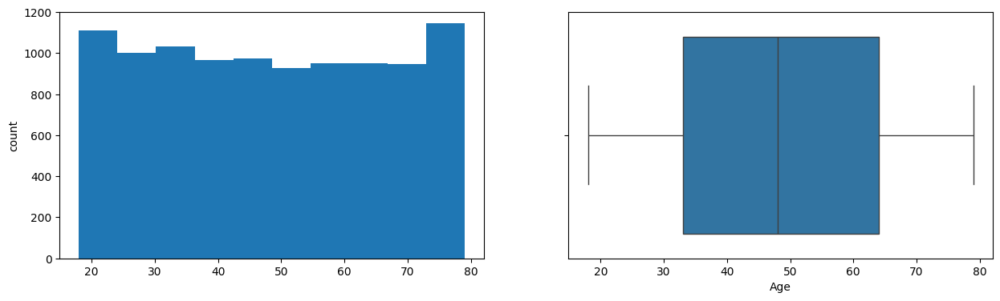

Tenure
Skew : 0.0


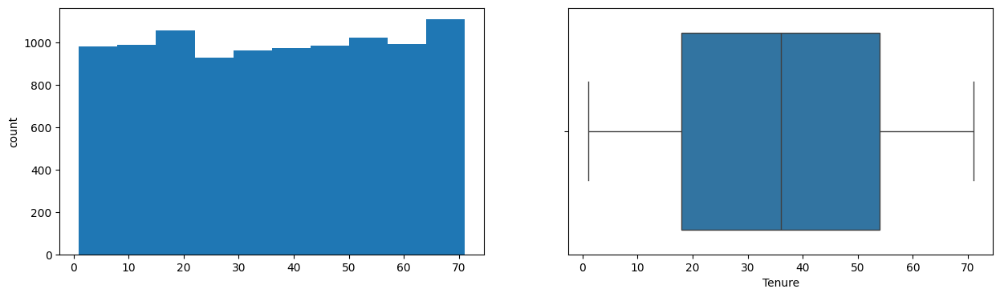

MonthlyCharges
Skew : -0.01


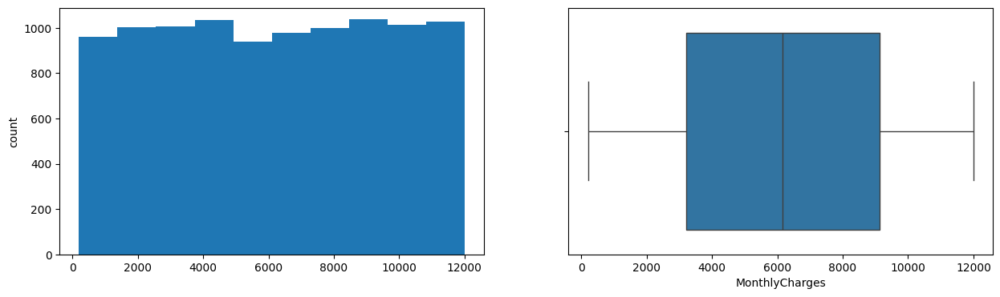

TotalCharges
Skew : 0.02


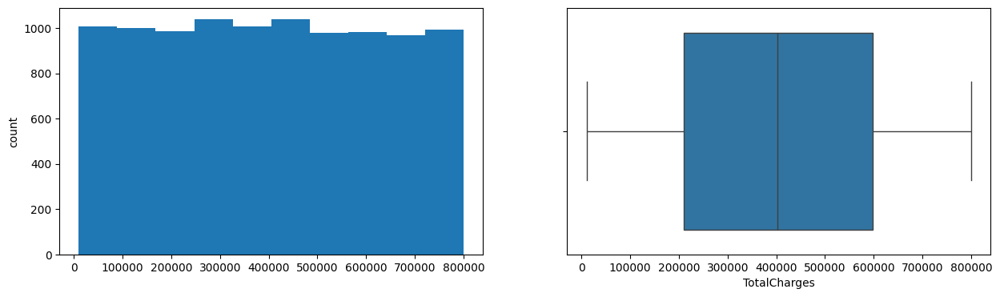

In [ ]:
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()

In [ ]:
cat_cols

Index(['Gender', 'Contract', 'PaymentMethod', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Churn'],
      dtype='object')

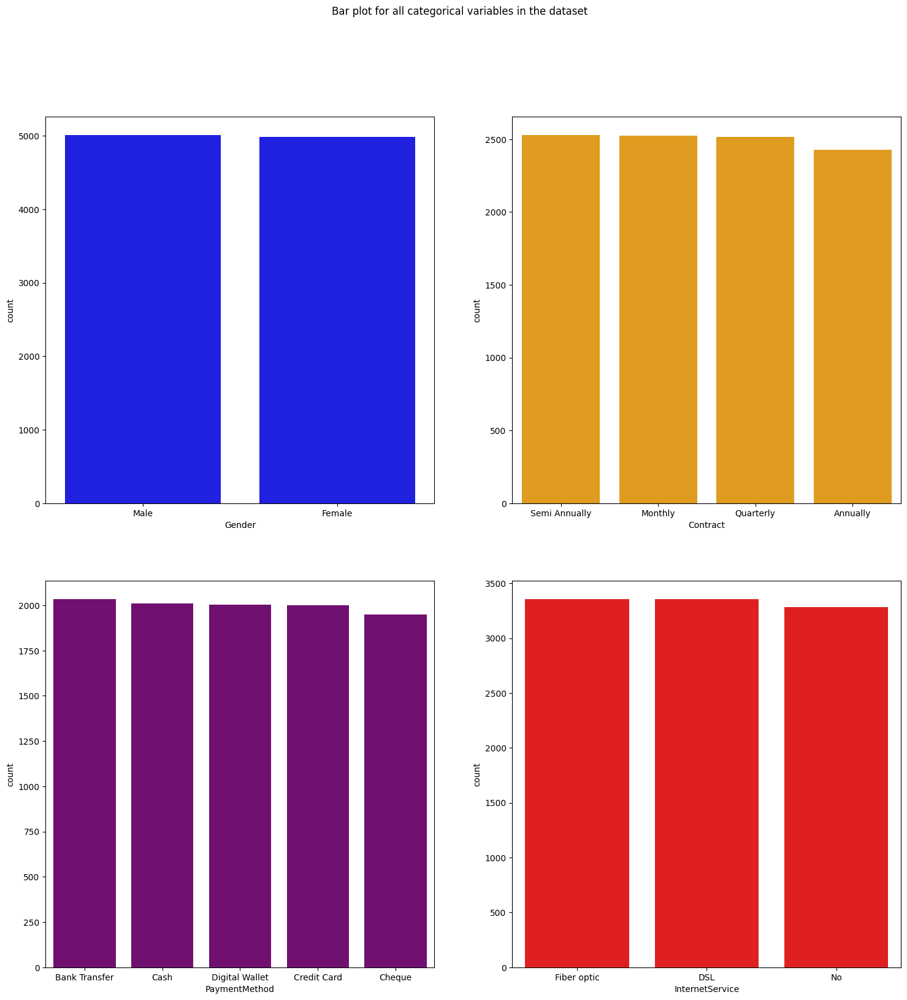

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')

sns.countplot(ax = axes[0, 0], x = 'Gender', data = df, color = 'blue',
              order = df['Gender'].value_counts().index);

sns.countplot(ax = axes[0, 1], x = 'Contract', data = df, color = 'orange',
              order = df['Contract'].value_counts().index);

sns.countplot(ax = axes[1, 0], x = 'PaymentMethod', data = df, color = 'purple',
              order = df['PaymentMethod'].value_counts().index);

sns.countplot(ax = axes[1, 1], x = 'InternetService', data = df, color = 'red',
              order = df['InternetService'].value_counts().index);

# sns.countplot(ax = axes[0, 1], x = 'OnlineSecurity', data = df, color = 'pink',
#               order = df['OnlineSecurity'].value_counts().index);

# sns.countplot(ax = axes[1, 1], x = 'OnlineBackup', data = df, color = 'yellow',
#               order = df['OnlineBackup'].value_counts().index);

# sns.countplot(ax = axes[1, 1], x = 'DeviceProtection', data = df, color = 'green',
#               order = df['DeviceProtection'].value_counts().index);

# sns.countplot(ax = axes[1, 1], x = 'TechSupport', data = df, color = 'black',
#               order = df['TechSupport'].value_counts().index);

# sns.countplot(ax = axes[1, 1], x = 'StreamingTV', data = df, color = 'red',
#               order = df['StreamingTV'].value_counts().index);

# sns.countplot(ax = axes[1, 1], x = 'StreamingMovies', data = df, color = 'pink',
#               order = df['StreamingMovies'].value_counts().index);






In [ ]:
# plt.figure(figsize=(6,4))
# sns.countplot(x="Gender", data=df, palette="dark")
# plt.xlabel("Gender", fontsize=10)
# plt.show()

**From the above chart we can see the weight of customers in basis of gender.**

<Axes: xlabel='TotalCharges', ylabel='Density'>

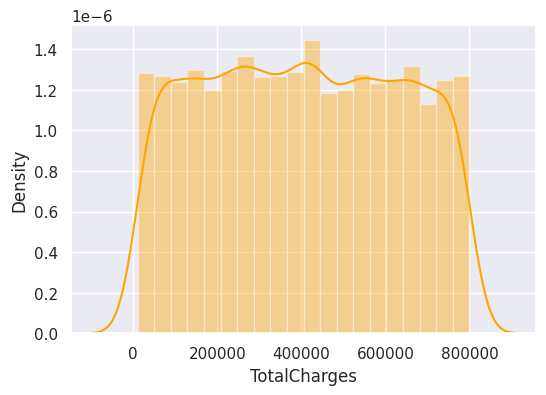

In [ ]:
sns.set(rc={"figure.figsize":(6,4)})
sns.distplot(df["TotalCharges"], kde=True, color="orange", bins=20)

**From the above chart we can say that most of the customers paying total charges from 20k to 70k approximately**

<Axes: xlabel='Age', ylabel='Density'>

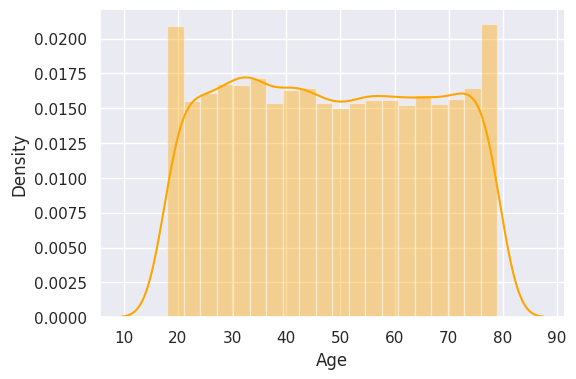

In [ ]:
sns.set(rc={"figure.figsize":(6,4)})
sns.distplot(df["Age"], kde=True, color="orange", bins=20)

**From the above chart we can conclude that most of the customer's age falls from 20 to 70**

<Axes: xlabel='MonthlyCharges', ylabel='Density'>

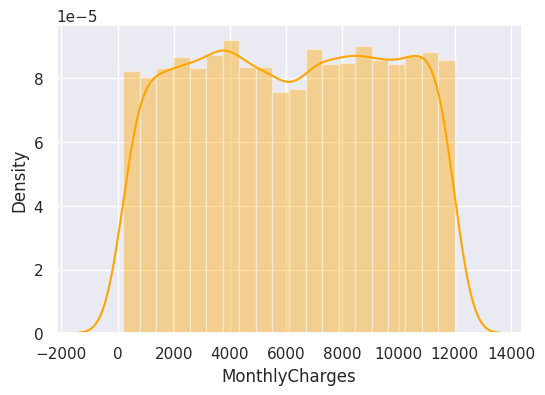

In [ ]:
sns.set(rc={"figure.figsize":(6,4)})
sns.distplot(df["MonthlyCharges"], kde=True, color="orange", bins=20)

**By seeing the above chart we can conclude that most of the customers paying monthly charge from 2k to 11k.**

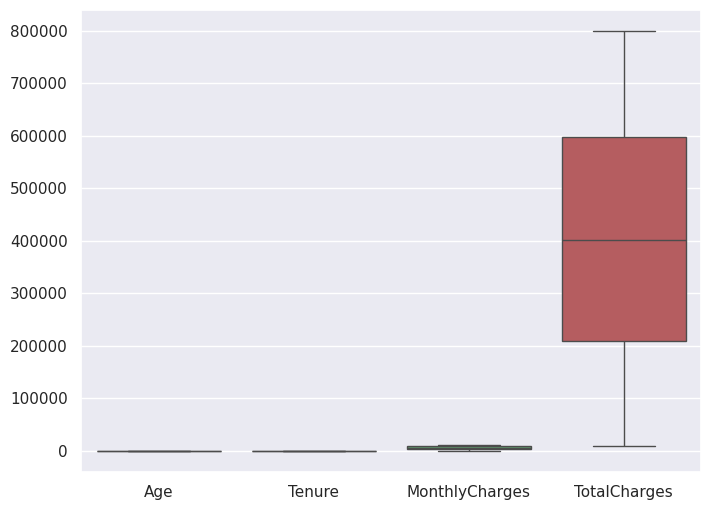

In [ ]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df)
plt.show()

In [ ]:
# def remove_outlier(col):
#     sorted(col)
#     Q1,Q3 = col.quantile([0.25,0.75])
#     IQR = Q3 - Q1
#     lower_range = Q1 - (1.5 * IQR)
#     upper_range = Q3 + (1.5 * IQR)
#     return lower_range,upper_range

In [ ]:
# lower_range,upper_range = remove_outlier(df["TotalCharges"])
# df["TotalCharges"] = np.where(df["TotalCharges"] > upper_range,
# upper_range, df["TotalCharges"])
# df["TotalCharges"] = np.where(df["TotalCharges"] < lower_range,
# lower_range, df["TotalCharges"])

In [ ]:
# plt.figure(figsize=(8,6))
# sns.boxplot(data=df)
# plt.show()

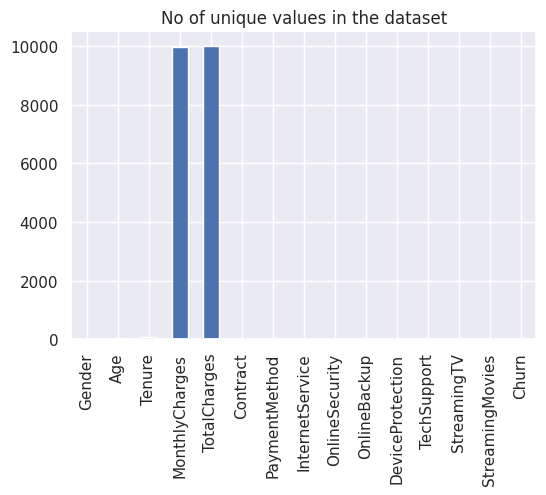

In [ ]:
df.nunique().plot(kind='bar')
plt.title('No of unique values in the dataset')
plt.show()

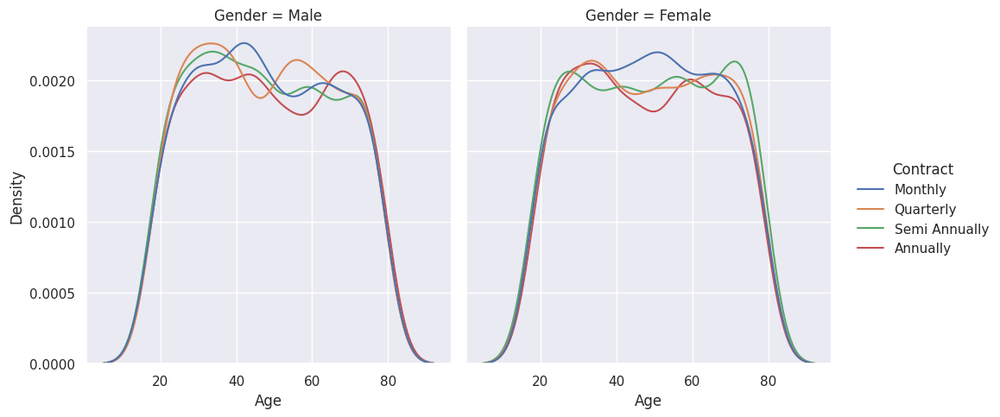

In [ ]:
sns.displot(data=df, x="Age", hue="Contract", col="Gender", kind="kde");

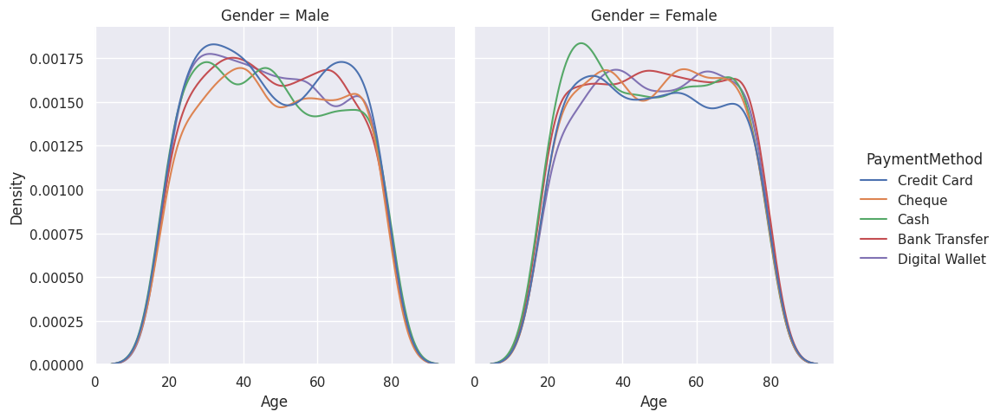

In [ ]:
sns.displot(data=df, x="Age", hue="PaymentMethod", col="Gender", kind="kde");

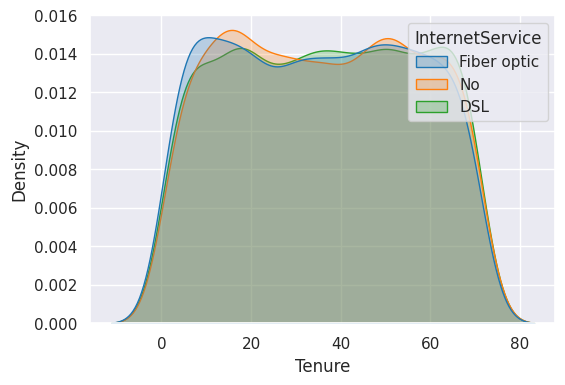

In [ ]:
sns.kdeplot( data=df, x="Tenure", hue="InternetService", fill=True, common_norm=False, palette="tab10");

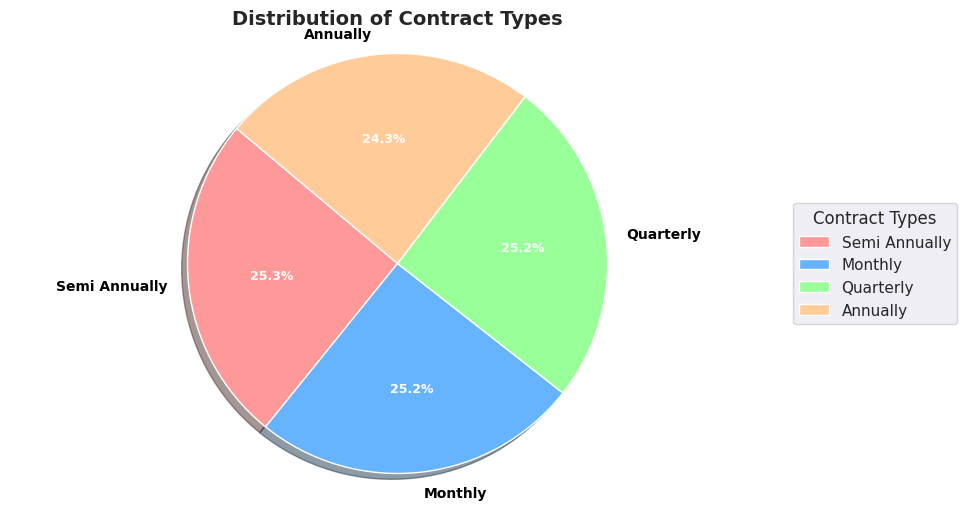

In [ ]:
contract_count = df.Contract.value_counts()
# Define labels and size:
labels = contract_count.index
sizes = contract_count.values
# Colors for each slice
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
# Create the pie chart
plt.figure(figsize=(10, 6))

wedges, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors,
                                   autopct='%1.1f%%', shadow=True, startangle=140,
                                   wedgeprops=dict(edgecolor='w'))

# Customizing text properties
plt.setp(texts, size=10, weight='bold', color='black')
plt.setp(autotexts, size=9, weight='bold', color='white')

# Customizing the legend
plt.legend(wedges, labels, title="Contract Types", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Adding a title
plt.title('Distribution of Contract Types', fontsize=14, weight='bold')

# Ensuring the pie chart is circular
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the plot
plt.show()

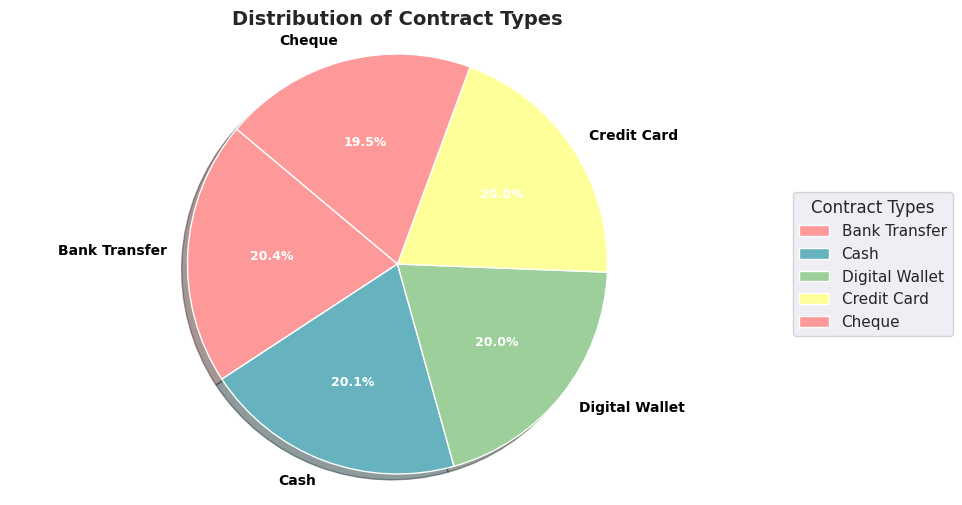

In [ ]:
paymentmethod_count = df.PaymentMethod.value_counts()
# Define labels and size:
labels = paymentmethod_count.index
sizes = paymentmethod_count.values
# Colors for each slice
colors = ['#fd9999','#66b3bf','#9ccf99','#ffff99']
# Create the pie chart
plt.figure(figsize=(10, 6))

wedges, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors,
                                   autopct='%1.1f%%', shadow=True, startangle=140,
                                   wedgeprops=dict(edgecolor='w'))

# Customizing text properties
plt.setp(texts, size=10, weight='bold', color='black')
plt.setp(autotexts, size=9, weight='bold', color='white')

# Customizing the legend
plt.legend(wedges, labels, title="Contract Types", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Adding a title
plt.title('Distribution of Contract Types', fontsize=14, weight='bold')

# Ensuring the pie chart is circular
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the plot
plt.show()

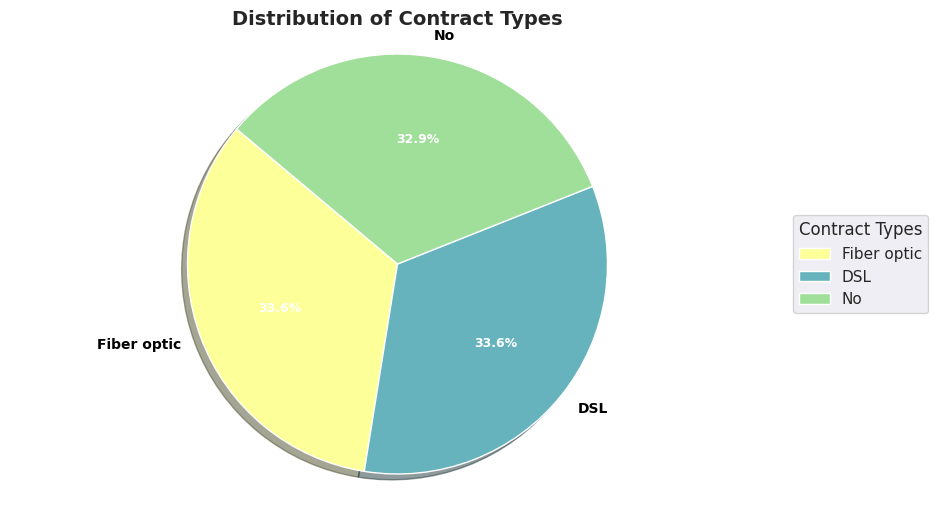

In [ ]:
payminternetservice_count = df.InternetService.value_counts()
# Define labels and size:
labels = payminternetservice_count.index
sizes = payminternetservice_count.values
# Colors for each slice
colors = ['#fdff99','#66b3bE','#9fdf99']
# Create the pie chart
plt.figure(figsize=(10, 6))

wedges, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors,
                                   autopct='%1.1f%%', shadow=True, startangle=140,
                                   wedgeprops=dict(edgecolor='w'))

# Customizing text properties
plt.setp(texts, size=10, weight='bold', color='black')
plt.setp(autotexts, size=9, weight='bold', color='white')

# Customizing the legend
plt.legend(wedges, labels, title="Contract Types", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Adding a title
plt.title('Distribution of Contract Types', fontsize=14, weight='bold')

# Ensuring the pie chart is circular
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the plot
plt.show()

<Axes: ylabel='count'>

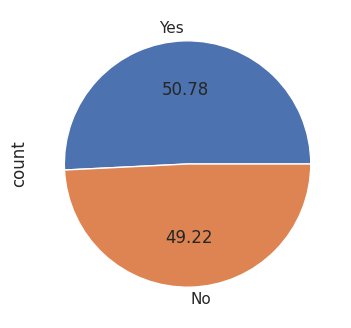

In [ ]:
df['OnlineSecurity'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['OnlineSecurity'])

<Axes: ylabel='count'>

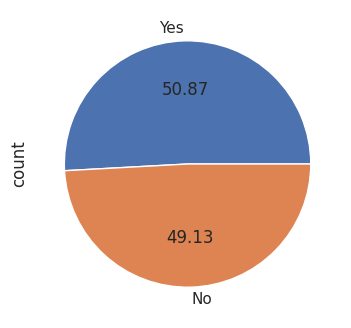

In [ ]:
df['OnlineBackup'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['OnlineBackup'])

<Axes: ylabel='count'>

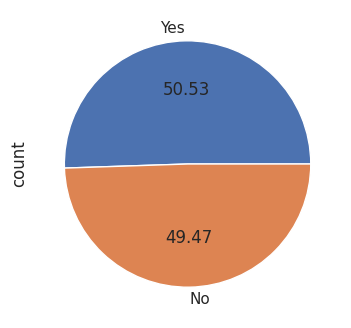

In [ ]:
df['DeviceProtection'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['DeviceProtection'])

<Axes: ylabel='count'>

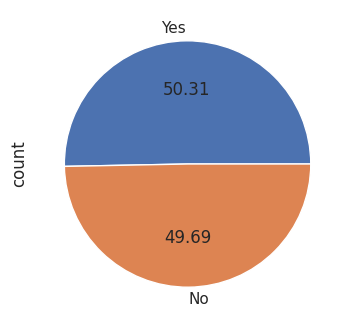

In [ ]:
df['TechSupport'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['TechSupport'])

<Axes: ylabel='count'>

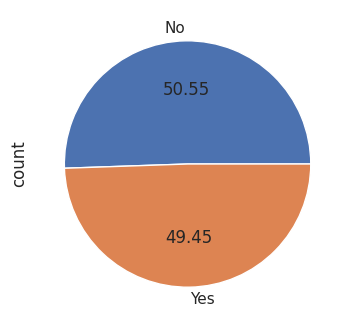

In [ ]:
df['StreamingTV'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['StreamingTV'])

<Axes: ylabel='count'>

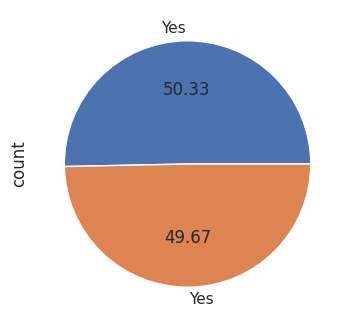

In [ ]:
df['StreamingMovies'].value_counts().plot(kind='pie', autopct='%.2f', labels=df['StreamingMovies'])

In [ ]:
df['InternetService'].value_counts()

InternetService
Fiber optic    3358
DSL            3356
No             3286
Name: count, dtype: int64

(0.0, 6000.0)

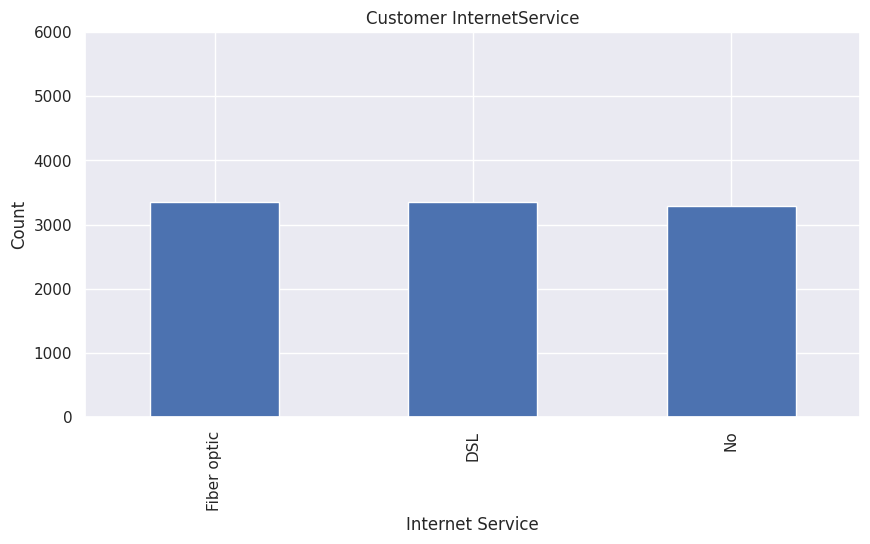

In [ ]:
plt.figure(figsize=(10,5))
df['InternetService'].value_counts().plot(kind='bar')
plt.title('Customer InternetService')
plt.xlabel('Internet Service')
plt.ylabel('Count')
plt.ylim(0, 6000)

In [ ]:
df['Contract'].value_counts()


Contract
Semi Annually    2530
Monthly          2524
Quarterly        2518
Annually         2428
Name: count, dtype: int64

(0.0, 6000.0)

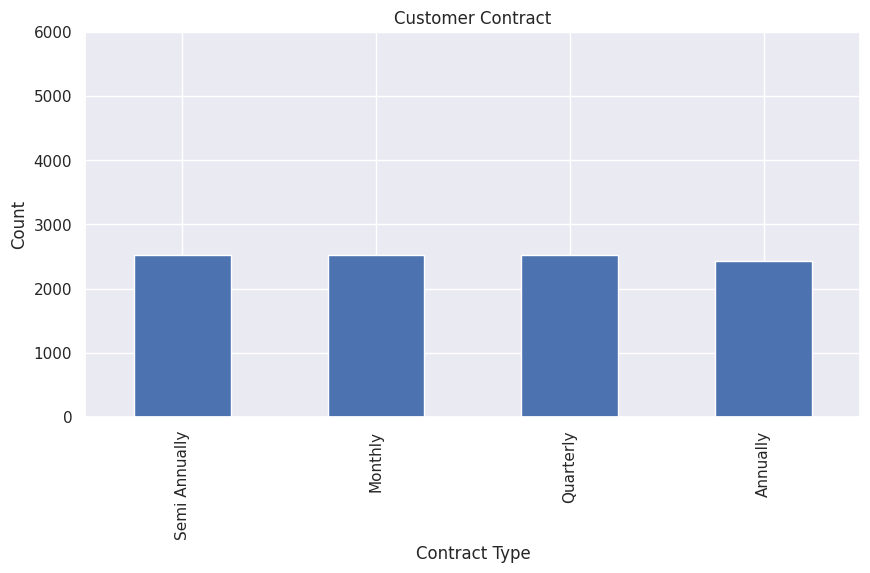

In [ ]:
plt.figure(figsize=(10,5))
df['Contract'].value_counts().plot(kind='bar')
plt.title('Customer Contract')
plt.xlabel('Contract Type')
plt.ylabel('Count')
plt.ylim(0, 6000)

In [ ]:
df["PaymentMethod"].value_counts()

PaymentMethod
Bank Transfer     2035
Cash              2010
Digital Wallet    2004
Credit Card       2001
Cheque            1950
Name: count, dtype: int64

(0.0, 6000.0)

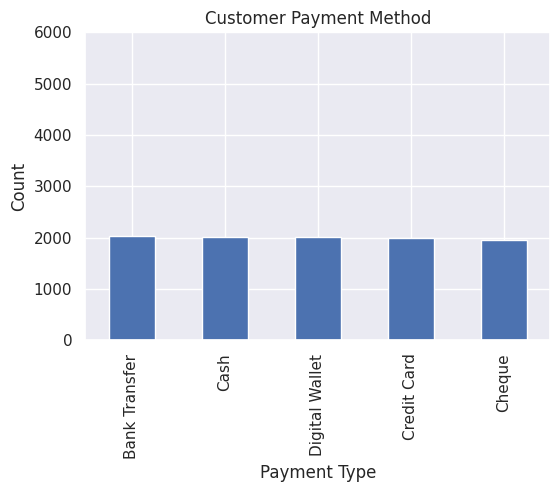

In [ ]:
df['PaymentMethod'].value_counts().plot(kind='bar')
plt.title('Customer Payment Method')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.ylim(0, 6000)

In [ ]:
df["InternetService"].value_counts()

InternetService
Fiber optic    3358
DSL            3356
No             3286
Name: count, dtype: int64

(0.0, 6000.0)

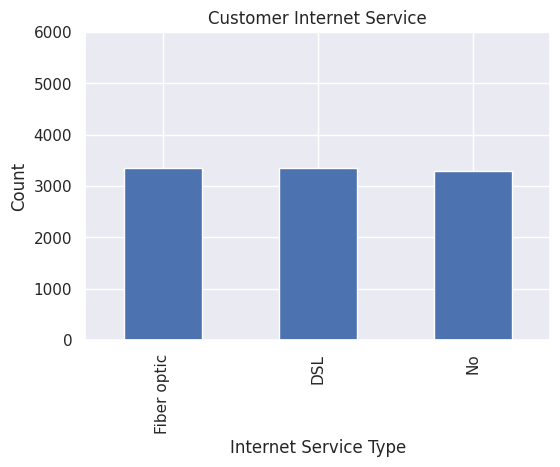

In [ ]:
df['InternetService'].value_counts().plot(kind='bar')
plt.title('Customer Internet Service')
plt.xlabel('Internet Service Type')
plt.ylabel('Count')
plt.ylim(0, 6000)

In [ ]:
# cc=df.groupby('Gender') ['Age'].mean()
# df3=pd.DataFrame(cc)
# df3
ga = df.groupby('Gender')['Age'].mean().sort_values(ascending=False)
df3 = pd.DataFrame(ga)
df3


,Age
Gender,
Female,48.53
Male,48.14


In [ ]:
gt = df.groupby('Gender')['Tenure'].mean().sort_values(ascending=False)
df4 = pd.DataFrame(gt)
df4

,Tenure
Gender,
Male,36.07
Female,35.80


In [ ]:
gm = df.groupby('Gender')['MonthlyCharges'].mean().sort_values(ascending=False)
df5 = pd.DataFrame(gm)
df5

,MonthlyCharges
Gender,
Male,6175.51
Female,6118.96


In [ ]:
gto = df.groupby('Gender')['TotalCharges'].mean().sort_values(ascending=False)
df6 = pd.DataFrame(gto)
df6

,TotalCharges
Gender,
Male,403078.81
Female,402056.17


In [ ]:
ca = df.groupby('Contract')['Age'].mean().sort_values(ascending=False)
df7 = pd.DataFrame(ca)
df7

,Age
Contract,
Annually,48.41
Monthly,48.33
Semi Annually,48.33
Quarterly,48.27


In [ ]:
ct = df.groupby('Contract')['Tenure'].mean().sort_values(ascending=False)
df8 = pd.DataFrame(ct)
df8

,Tenure
Contract,
Quarterly,35.99
Semi Annually,35.96
Monthly,35.94
Annually,35.85


In [ ]:
cm = df.groupby('Contract')['MonthlyCharges'].mean().sort_values(ascending=False)
df9 = pd.DataFrame(cm)
df9

,MonthlyCharges
Contract,
Semi Annually,6227.80
Annually,6164.11
Monthly,6105.28
Quarterly,6092.34


In [ ]:
cto = df.groupby('Contract')['TotalCharges'].mean().sort_values(ascending=False)
df10 = pd.DataFrame(cto)
df10

,TotalCharges
Contract,
Monthly,406134.72
Annually,404589.54
Quarterly,400259.15
Semi Annually,399370.83


In [ ]:
pa =df.groupby('PaymentMethod')['Age'].mean().sort_values(ascending=False)
df11 = pd.DataFrame(pa)
df11

,Age
PaymentMethod,
Cheque,48.61
Digital Wallet,48.54
Bank Transfer,48.50
Credit Card,48.26
Cash,47.76


In [ ]:
pt = df.groupby('PaymentMethod')['Tenure'].mean().sort_values(ascending=False)
df12 = pd.DataFrame(pt)
df12

,Tenure
PaymentMethod,
Digital Wallet,36.35
Cash,36.06
Credit Card,35.98
Cheque,35.81
Bank Transfer,35.47


In [ ]:
pm = df.groupby('PaymentMethod')['MonthlyCharges'].mean().sort_values(ascending=False)
df13 = pd.DataFrame(pm)
df13

,MonthlyCharges
PaymentMethod,
Bank Transfer,6253.31
Cash,6135.89
Credit Card,6120.54
Cheque,6116.96
Digital Wallet,6107.37


In [ ]:
pto = df.groupby('PaymentMethod')['TotalCharges'].mean().sort_values(ascending=False)
df14 = pd.DataFrame(pto)
df14

,TotalCharges
PaymentMethod,
Cash,407940.75
Bank Transfer,404939.66
Digital Wallet,402711.59
Cheque,402317.70
Credit Card,394863.33


In [ ]:
ia = df.groupby('InternetService')['Age'].mean().sort_values(ascending=False)
df15 = pd.DataFrame(ia)
df15

,Age
InternetService,
Fiber optic,48.53
DSL,48.24
No,48.23


In [ ]:
it = df.groupby('InternetService')['Tenure'].mean().sort_values(ascending=False)
df16 = pd.DataFrame(it)
df16

,Tenure
InternetService,
DSL,36.38
No,36.09
Fiber optic,35.33


In [ ]:
im = df.groupby('InternetService')['MonthlyCharges'].mean().sort_values(ascending=False)
df17 = pd.DataFrame(im)
df17

,MonthlyCharges
InternetService,
Fiber optic,6161.53
No,6161.05
DSL,6119.62


In [ ]:
ito = df.groupby('InternetService')['TotalCharges'].mean().sort_values(ascending=False)
df18 = pd.DataFrame(ito)
df18

,TotalCharges
InternetService,
DSL,405200.20
No,404567.24
Fiber optic,397983.44


In [ ]:
df.head(2)

,Gender,Age,Tenure,MonthlyCharges,TotalCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churn
0,Male,68,17,6365.68,339619.69,Monthly,Credit Card,Fiber optic,Yes,Yes,Yes,Yes,No,Yes,Yes
1,Female,57,52,7282.59,215761.66,Quarterly,Cheque,Fiber optic,No,No,No,No,Yes,Yes,No


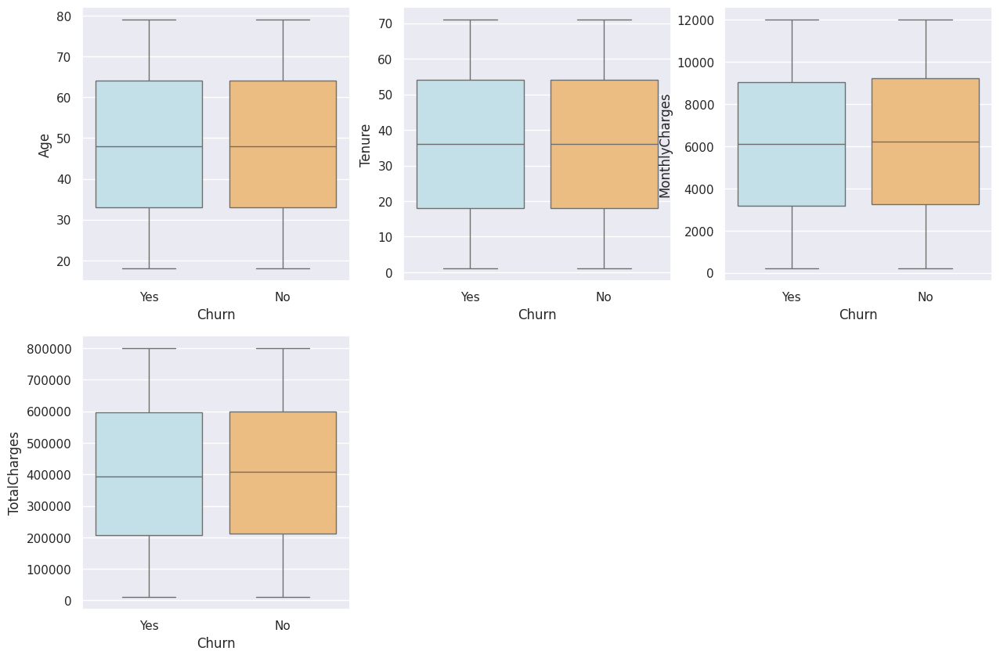

In [ ]:
num_list = ['Age', 'Tenure', 'MonthlyCharges', 'TotalCharges']
fig = plt.figure(figsize=(15,10))
for i in range(len(num_list)):
    column=num_list[i]
    sub=fig.add_subplot(2,3, i+1)
    sns.boxplot(x='Churn', y=column, data=df, palette='RdYlBu_r')

In [ ]:
df.select_dtypes(include='object').nunique()

Gender              2
Contract            4
PaymentMethod       5
InternetService     3
OnlineSecurity      2
OnlineBackup        2
DeviceProtection    2
TechSupport         2
StreamingTV         2
StreamingMovies     2
Churn               2
dtype: int64

In [ ]:
# from sklearn import preprocessing
# for col in df.select_dtypes(include=['object']).columns:
#     label_encoder=preprocessing.LabelEncoder()
#     label_encoder.fit(df[col].unique())
#     df[col]=label_encoder.transform(df[col])
#     print(f"{col}:{df[col].unique()}")

Text(0.5, 1.0, 'Customer Age')

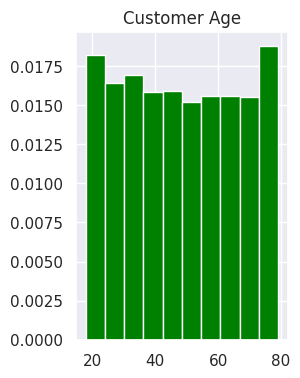

In [ ]:
#to check the normality of the distribution
# plt.rcParams["figure.figsize"] = (9,3)
# plt.xlim([0,100])

plt.subplot(1, 2, 2)
Age = plt.hist(df['Age'], density = True, color = "green")
plt.title("Customer Age")

Text(0.5, 1.0, 'Tenure')

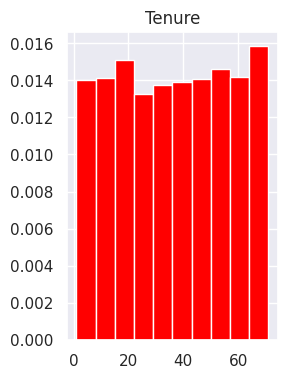

In [ ]:
plt.subplot(1, 2, 2)
Tenure = plt.hist(df['Tenure'], density = True, color = "red")
plt.title("Tenure")

Text(0.5, 1.0, 'Monthly Charges')

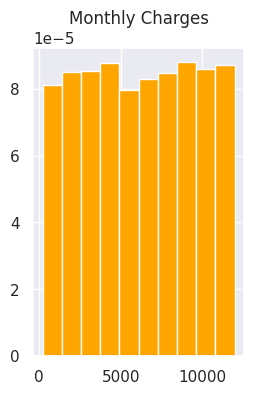

In [ ]:
plt.subplot(1, 2, 2)
MonthlyCharges = plt.hist(df['MonthlyCharges'], density = True, color = "orange")
plt.title("Monthly Charges")

Text(0.5, 1.0, 'TotalCharges')

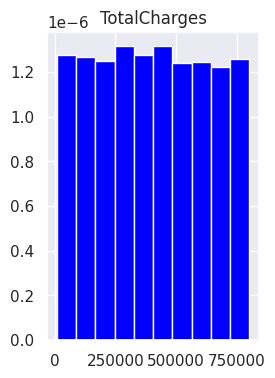

In [ ]:
plt.subplot(1, 2, 2)
TotalCharges = plt.hist(df['TotalCharges'], density = True, color = "blue")
plt.title("TotalCharges")


In [ ]:
# sns.set_theme(style="whitegrid")

# plt.figure(figsize=(10, 6))
# sns.barplot(x='Contract', y='Age', hue='Gender', data=df, palette='muted')

# plt.title('Age by contract and  Gender')
# plt.xlabel('Customers Contract')
# plt.ylabel("Customer's age")
# plt.legend(title ='Gender')
# plt.legend()
# # Display the plot
# plt.show()


In [ ]:

# plt.figure(figsize=(6, 4))
# sns.barplot(x='Gender', y='MonthlyCharges', data=df)
# plt.title('Monthly Charges by Gender')
# plt.xlabel('Gender')
# plt.ylabel('MonthlyCharges')
# plt.show()

In [ ]:
# plt.figure(figsize=(6, 4))
# sns.barplot(x='Gender', y='Tenure', data=df)
# plt.title('Tenure by Gender')
# plt.xlabel('Gender')
# plt.ylabel('Tenure')
# plt.show()

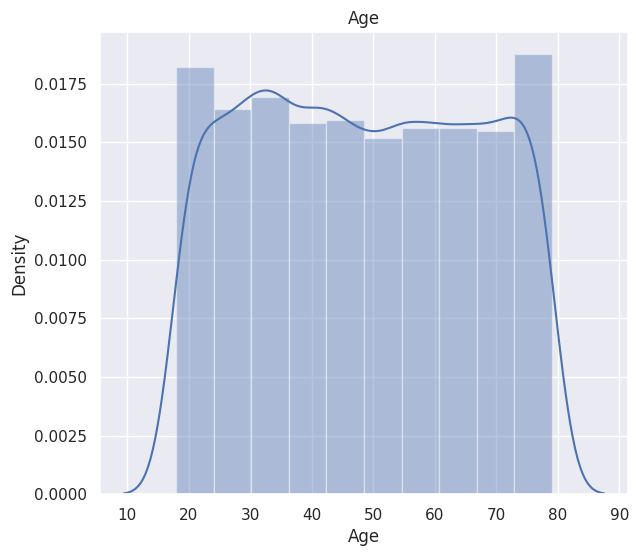

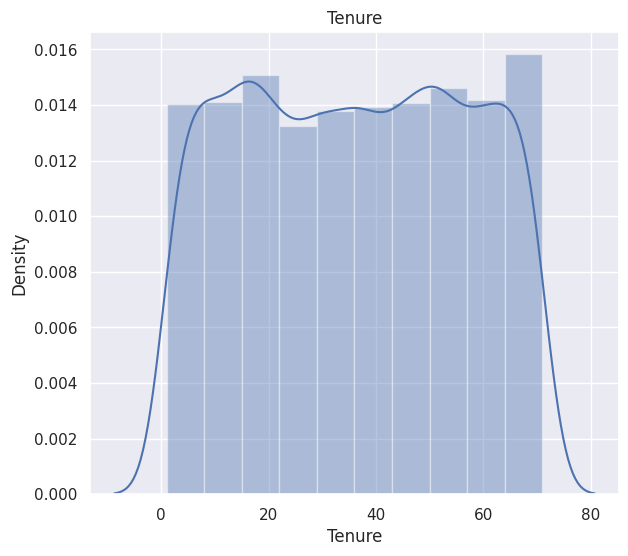

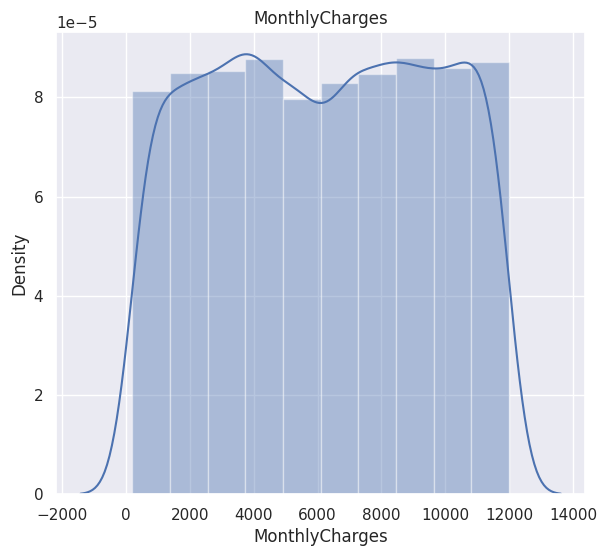

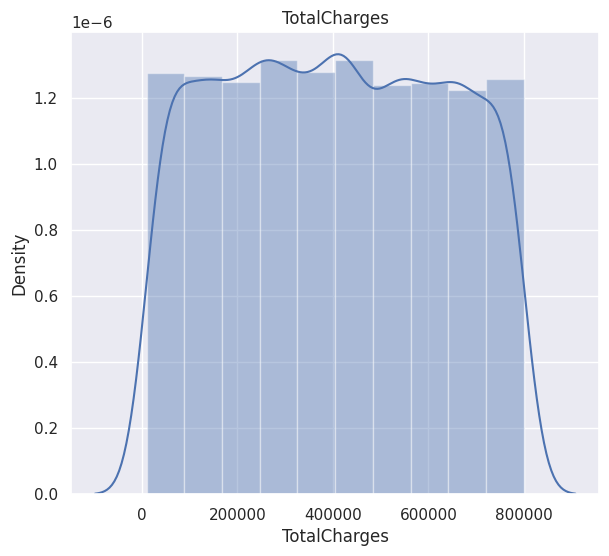

In [ ]:
from scipy import stats

num_cols = df.select_dtypes(include=["int64","float64"])
def plots(num_cols, variable):
    plt.figure(figsize=(15,6))
    plt.subplot(1,2, 2)
    #num_cols[variable].hist()
    sns.distplot(num_cols[variable], kde=True, bins=10)
    plt.title(variable)
    plt.subplot(1, 2, 2)
    stats.probplot(num_cols[variable], dist="norm")
    plt.title(variable)
    plt.show()
for i in num_cols.columns:
    plots(num_cols, i)

**Now let's start Feature Engineering part. Here, we don't need to do much more as we just need to convert caterogical feature into numerical features. To accolplish this we will use different type of encoding methods provided by sklearn library. like label encoder, onehotencoder, ordinal encoder, binary encoder arrordingly**

In [ ]:
df.Contract.value_counts()

Contract
Semi Annually    2530
Monthly          2524
Quarterly        2518
Annually         2428
Name: count, dtype: int64

In [ ]:
# let's convert contract values into numerical.
from sklearn.preprocessing import LabelEncoder

# Initialize the label encoder
le = LabelEncoder()

# Fit and transform the data
df['Contract_encoded'] = le.fit_transform(df['Contract'])
df['Payment_Method'] = le.fit_transform(df['PaymentMethod'])
df['Internet_Service'] = le.fit_transform(df['InternetService'])
df['Gender_encoded'] = le.fit_transform(df['Gender'])


In [ ]:
import pandas as pd
# Define the mapping
onlinesecurity_mapping = {'Yes': 1, 'No': 0}
onlinebackup_mapping = {'Yes':1, 'No':0}
deviceprotection_mapping = {'Yes':1, 'No':0}
techsupport_mapping = {'Yes':1, 'No':0}
streamingTV_mapping = {'Yes':1, 'No':0}
streamingmovies_mapping = {'Yes':1, 'No':0}
# Apply the mapping
df['Onlinesecurity_encoded'] = df['OnlineSecurity'].map(onlinesecurity_mapping)
df['Onlinebackup_encoded'] = df['OnlineBackup'].map(onlinebackup_mapping)
df['deviceprotection_encoded'] = df['DeviceProtection'].map(deviceprotection_mapping)
df['techsupport_encoded'] = df['TechSupport'].map(techsupport_mapping)
df['streamingTV_encoded'] = df['StreamingTV'].map(streamingTV_mapping)
df['streamingmovies_encoded'] = df['StreamingMovies'].map(streamingmovies_mapping)



In [ ]:
df[["Gender","Gender_encoded"]]

,Gender,Gender_encoded
0,Male,1
1,Female,0
2,Male,1
3,Male,1
4,Male,1
5,Female,0
6,Male,1
7,Male,1
8,Male,1
9,Female,0


**Let's encode the dependent/ target variable also using manual mapping which is effective and easy to apply.**

In [ ]:
churn_mapping = {'Yes':1, 'No':0}
# Apply the mapping
df['Churned'] = df['Churn'].map(churn_mapping)

In [ ]:
df[["Churn","Churned"]]

,Churn,Churned
0,Yes,1
1,No,0
2,Yes,1
3,No,0
4,Yes,1
5,Yes,1
6,Yes,1
7,No,0
8,No,0
9,No,0


In [ ]:
gc=df.groupby('Gender').sum()['Churned']
df3=pd.DataFrame(gc)
df3

,Churned
Gender,
Female,2473
Male,2493


In [ ]:
cc=df.groupby('Contract').sum()['Churned']
df4=pd.DataFrame(cc)
df4

,Churned
Contract,
Annually,1208
Monthly,1249
Quarterly,1260
Semi Annually,1249


In [ ]:
pc=df.groupby('PaymentMethod').sum()['Churned']
df5=pd.DataFrame(pc)
df5

,Churned
PaymentMethod,
Bank Transfer,1035
Cash,1015
Cheque,961
Credit Card,970
Digital Wallet,985


In [ ]:
ic=df.groupby('InternetService').sum()['Churned']
df6=pd.DataFrame(ic)
df6

,Churned
InternetService,
DSL,1655
Fiber optic,1693
No,1618


In [ ]:
pg=df.groupby('Gender').sum()['Internet_Service']
df7=pd.DataFrame(pg)
df7

,Internet_Service
Gender,
Female,4861
Male,5069


In [ ]:
# Filter for male customers who have churned and have an annual contract
filtered_df = df[(df['Gender'] == 'Male') & (df['Churn'] == 'Yes') & (df['Contract'] == 'Annually')]

count = filtered_df.shape[0]

count

615

In [ ]:
df['Churned'].value_counts()

Churned
0    5034
1    4966
Name: count, dtype: int64

In [ ]:
#we oversample the minority class to balance the label
# from sklearn.utils import resample
# churn_majority=df[(df['Churned']==0)]
# churn_minority=df[(df['Churned']==1)]
# churn_minority_upsampled=resample(churn_minority,
# replace=True,
# n_samples=9999,
# random_state=0)
# churn_upsampled=pd.concat([churn_minority_upsampled, churn_majority])

**Now Let's remove the original categorical variable from the data set to prevents redundancy and potential confusion during the modeling process. The encoded numerical values will be used by machine learning algorithms, and the original categorical columns are no longer needed**

In [ ]:
# List of columns to remove
columns_to_remove = ['Gender', 'Contract','PaymentMethod', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
                    'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Churn']

# Correct way without reassigning
df.drop(columns=columns_to_remove,axis=1, inplace=True)
print(df)  # This will print the DataFrame correctly

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
df.head(3)

,Age,Tenure,MonthlyCharges,TotalCharges,Contract_encoded,Payment_Method,Internet_Service,Gender_encoded,Onlinesecurity_encoded,Onlinebackup_encoded,deviceprotection_encoded,techsupport_encoded,streamingTV_encoded,streamingmovies_encoded,Churned
0,68,17,6365.68,339619.69,1,3,1,1,1,1,1,1,0,1,1
1,57,52,7282.59,215761.66,2,2,1,0,0,0,0,0,1,1,0
2,24,12,3366.31,632734.95,3,3,1,1,1,0,1,0,0,0,1


**Here, in our dtaset we can see that TotalCharges values is bit confusing as it's not the multiply of MonthlyCharges * Tenure. Example: Let's take o index row, in that row tenure is 17(probabily this is in months) and MonthlyCharges is 6365.68, if we multiply both the value is 108,216.56 but in dataset the value of TotalCharges is 339619. So probabily they have added extra services and physical devices price also. So let's do transform. Let's create a column called OverallCharges by adding MonthlyCharges and TotalCharges, which will removes the 2 variables and and add 1 variable in our datasetwhich will make our datase  little bit simple and easy to process.**



In [ ]:
# Create a column OverallCharges by adding the value of MonthlyCharges and TotalCharges.
df['OverallCharges'] = df['MonthlyCharges'] + df['MonthlyCharges']
# This code is not giving expected output. So let's check the data integrity.

In [ ]:
df.head(2)

,Age,Tenure,MonthlyCharges,TotalCharges,Contract_encoded,Payment_Method,Internet_Service,Gender_encoded,Onlinesecurity_encoded,Onlinebackup_encoded,deviceprotection_encoded,techsupport_encoded,streamingTV_encoded,streamingmovies_encoded,Churned,OverallCharges
0,68,17,6365.68,339619.69,1,3,1,1,1,1,1,1,0,1,1,12731.36
1,57,52,7282.59,215761.66,2,2,1,0,0,0,0,0,1,1,0,14565.18


In [ ]:

# Strip whitespace from columns
df['MonthlyCharges'] = df['MonthlyCharges'].astype(str).str.strip()
df['TotalCharges'] = df['TotalCharges'].astype(str).str.strip()

# Convert to numeric after stripping
df['MonthlyCharges'] = pd.to_numeric(df['MonthlyCharges'], errors='coerce')
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')


In [ ]:
# Additional Check: Validate each addition
for index, row in df.iterrows():
    expected = row['MonthlyCharges'] + row['TotalCharges']
    actual = row['OverallCharges']
    print(f"Row {index}: {row['MonthlyCharges']} + {row['TotalCharges']} = {actual}, Expected = {expected}, Match = {actual == expected}")

Streaming output truncated to the last 5000 lines.
Row 5000: 766.09 + 98770.13 = 1532.18, Expected = 99536.22, Match = False
Row 5001: 11605.38 + 447635.34 = 23210.76, Expected = 459240.72000000003, Match = False
Row 5002: 8815.12 + 286463.8 = 17630.24, Expected = 295278.92, Match = False
Row 5003: 8684.88 + 651921.42 = 17369.76, Expected = 660606.3, Match = False
Row 5004: 1268.49 + 717592.74 = 2536.98, Expected = 718861.23, Match = False
Row 5005: 11166.34 + 200114.15 = 22332.68, Expected = 211280.49, Match = False
Row 5006: 5739.73 + 612995.8 = 11479.46, Expected = 618735.53, Match = False
Row 5007: 10256.95 + 432963.91 = 20513.9, Expected = 443220.86, Match = False
Row 5008: 348.69 + 319653.96 = 697.38, Expected = 320002.65, Match = False
Row 5009: 3718.84 + 631556.24 = 7437.68, Expected = 635275.08, Match = False
Row 5010: 11953.36 + 456289.79 = 23906.72, Expected = 468243.14999999997, Match = False
Row 5011: 5248.49 + 511874.4 = 10496.98, Expected = 517122.89, Match = False
Row 5

In [ ]:
print(df.isna().sum())
print(np.isfinite(df).sum())

Age                         0
Tenure                      0
MonthlyCharges              0
TotalCharges                0
Contract_encoded            0
Payment_Method              0
Internet_Service            0
Gender_encoded              0
Onlinesecurity_encoded      0
Onlinebackup_encoded        0
deviceprotection_encoded    0
techsupport_encoded         0
streamingTV_encoded         0
streamingmovies_encoded     0
Churned                     0
OverallCharges              0
dtype: int64
Age                         10000
Tenure                      10000
MonthlyCharges              10000
TotalCharges                10000
Contract_encoded            10000
Payment_Method              10000
Internet_Service            10000
Gender_encoded              10000
Onlinesecurity_encoded      10000
Onlinebackup_encoded        10000
deviceprotection_encoded    10000
techsupport_encoded         10000
streamingTV_encoded         10000
streamingmovies_encoded     10000
Churned                     100

In [ ]:
df['ComputedOverallCharges'] = df['MonthlyCharges'] + df['TotalCharges']

In [ ]:
df.head(6452)

,Age,Tenure,MonthlyCharges,TotalCharges,Contract_encoded,Payment_Method,Internet_Service,Gender_encoded,Onlinesecurity_encoded,Onlinebackup_encoded,deviceprotection_encoded,techsupport_encoded,streamingTV_encoded,streamingmovies_encoded,Churned,OverallCharges,ComputedOverallCharges
0,68,17,6365.68,339619.69,1,3,1,1,1,1,1,1,0,1,1,12731.36,345985.37
1,57,52,7282.59,215761.66,2,2,1,0,0,0,0,0,1,1,0,14565.18,223044.25
2,24,12,3366.31,632734.95,3,3,1,1,1,0,1,0,0,0,1,6732.62,636101.26
3,49,48,4723.65,731320.68,0,2,2,1,0,1,0,1,0,1,0,9447.30,736044.33
4,65,22,6728.20,251710.54,0,1,2,1,1,0,0,1,1,0,1,13456.40,258438.74
5,36,49,11315.40,623000.41,2,0,0,0,0,0,0,1,0,1,1,22630.80,634315.81
6,23,52,7783.77,525490.53,0,4,1,1,0,1,1,0,0,1,1,15567.54,533274.30
7,37,1,4130.78,791884.95,2,3,0,1,1,1,0,1,1,1,0,8261.56,796015.73
8,44,66,323.53,171154.24,0,3,1,1,1,0,0,1,0,1,0,647.06,171477.77
9,70,64,11783.65,768936.41,2,1,0,0,1,1,0,1,0,0,0,23567.30,780720.06


In [ ]:
# Drop original columns.
df.drop(columns=['MonthlyCharges','TotalCharges', 'OverallCharges'],axis=1, inplace=True)

In [ ]:
df.head(2)

,Age,Tenure,Contract_encoded,Payment_Method,Internet_Service,Gender_encoded,Onlinesecurity_encoded,Onlinebackup_encoded,deviceprotection_encoded,techsupport_encoded,streamingTV_encoded,streamingmovies_encoded,Churned,ComputedOverallCharges
0,68,17,1,3,1,1,1,1,1,1,0,1,1,345985.37
1,57,52,2,2,1,0,0,0,0,0,1,1,0,223044.25


In [ ]:
df.columns

Index(['Age', 'Tenure', 'Contract_encoded', 'Payment_Method',
       'Internet_Service', 'Gender_encoded', 'Onlinesecurity_encoded',
       'Onlinebackup_encoded', 'deviceprotection_encoded',
       'techsupport_encoded', 'streamingTV_encoded', 'streamingmovies_encoded',
       'Churned', 'ComputedOverallCharges'],
      dtype='object')

In [ ]:
# Rename columns using a dictionary
df.rename(columns={'Onlinesecurity_encoded': 'OnlineSecurity',
                        'Onlinebackup_encoded': 'OnlineBackup',
                        'deviceprotection_encoded': 'DeviceProtection',
                        'techsupport_encoded': 'TechSupport',
                        'streamingTV_encoded': 'StreamingTV',
                        'streamingmovies_encoded': 'StreamingMovies',
                        'Contract_encoded': 'Contract',
                        'Payment_Method':'PaymentMethod',
                        'Internet_Service':'InternetService',
                        'Gender_encoded':'Gender'
                        }, inplace=True)


In [ ]:
df.head(2)

,Age,Tenure,Contract,PaymentMethod,InternetService,Gender,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges
0,68,17,1,3,1,1,1,1,1,1,0,1,1,345985.37
1,57,52,2,2,1,0,0,0,0,0,1,1,0,223044.25


In [ ]:
# Reorder the columns
def reorder_columns(df, column_order):
    return df[column_order]

column_order = ['Gender', 'Age', 'Tenure','ComputedOverallCharges','Contract','PaymentMethod',
                'InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport',
                'StreamingTV', 'StreamingMovies', 'Churned']
df = reorder_columns(df, column_order)



In [ ]:
df.head(2)

,Gender,Age,Tenure,ComputedOverallCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned
0,1,68,17,345985.37,1,3,1,1,1,1,1,0,1,1
1,0,57,52,223044.25,2,2,1,0,0,0,0,1,1,0


In [ ]:
df["ComputedOverallCharges"].min()

11389.259999999998

In [ ]:
df["ComputedOverallCharges"].max()

809735.6599999999

In [ ]:
df['ComputedOverallCharges'].idxmin()

6450

In [ ]:
df.iloc[6450]

Gender                        0.00
Age                          70.00
Tenure                       36.00
ComputedOverallCharges    11389.26
Contract                      3.00
PaymentMethod                 3.00
InternetService               0.00
OnlineSecurity                1.00
OnlineBackup                  0.00
DeviceProtection              1.00
TechSupport                   1.00
StreamingTV                   1.00
StreamingMovies               1.00
Churned                       1.00
Name: 6450, dtype: float64

In [ ]:
# import minmaxscaler and standarscaler from sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [ ]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

In [ ]:
# Fit and transform the data
df['ComputedOverallCharges_scaled'] = scaler.fit_transform(df[['ComputedOverallCharges']])

In [ ]:
df.head(5)

,Gender,Age,Tenure,ComputedOverallCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled
0,1,68,17,345985.37,1,3,1,1,1,1,1,0,1,1,0.42
1,0,57,52,223044.25,2,2,1,0,0,0,0,1,1,0,0.27
2,1,24,12,636101.26,3,3,1,1,0,1,0,0,0,1,0.78
3,1,49,48,736044.33,0,2,2,0,1,0,1,0,1,0,0.91
4,1,65,22,258438.74,0,1,2,1,0,0,1,1,0,1,0.31


In [ ]:
df["Age"].min()

18

In [ ]:
df["Age"].max()

79

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the data
df['Age_standardized'] = scaler.fit_transform(df[['Age']])

In [ ]:
df.head(2)

,Gender,Age,Tenure,ComputedOverallCharges,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled,Age_standardized
0,1,68,17,345985.37,1,3,1,1,1,1,1,0,1,1,0.42,1.10
1,0,57,52,223044.25,2,2,1,0,0,0,0,1,1,0,0.27,0.48


In [ ]:
# drop columns Age and ComputedOverallCharges
df.drop(columns= ['Age','ComputedOverallCharges'], axis=1, inplace=True)

In [ ]:
df.head(2)

,Gender,Tenure,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled,Age_standardized
0,1,17,1,3,1,1,1,1,1,0,1,1,0.42,1.10
1,0,52,2,2,1,0,0,0,0,1,1,0,0.27,0.48


In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the data
df['Tenure_standardized'] = scaler.fit_transform(df[['Tenure']])

In [ ]:
df.head(2)

,Gender,Tenure,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled,Age_standardized,Tenure_standardized
0,1,17,1,3,1,1,1,1,1,0,1,1,0.42,1.10,-0.92
1,0,52,2,2,1,0,0,0,0,1,1,0,0.27,0.48,0.78


In [ ]:
# Drop column Tenure.
df.drop(columns= ['Tenure'], axis=1, inplace=True)

In [ ]:
df.head(2)

,Gender,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled,Age_standardized,Tenure_standardized
0,1,1,3,1,1,1,1,1,0,1,1,0.42,1.10,-0.92
1,0,2,2,1,0,0,0,0,1,1,0,0.27,0.48,0.78


In [ ]:
df.corr()

,Gender,Contract,PaymentMethod,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churned,ComputedOverallCharges_scaled,Age_standardized,Tenure_standardized
Gender,1.00e+00,-3.36e-03,1.32e-02,2.24e-02,-5.36e-03,-8.45e-04,7.17e-03,1.18e-03,-1.57e-03,-3.22e-03,1.42e-03,2.37e-03,-1.09e-02,6.37e-03
Contract,-3.36e-03,1.00e+00,8.44e-03,-1.51e-02,-1.05e-03,-8.94e-03,-1.44e-02,-1.49e-02,-1.23e-02,6.10e-03,-1.34e-03,-1.05e-02,-1.95e-03,2.15e-03
PaymentMethod,1.32e-02,8.44e-03,1.00e+00,-1.60e-03,-2.82e-03,-7.73e-03,3.36e-03,2.60e-02,4.52e-03,8.55e-03,-1.55e-02,-1.11e-02,4.56e-03,1.15e-02
InternetService,2.24e-02,-1.51e-02,-1.60e-03,1.00e+00,-3.32e-03,-5.99e-03,2.55e-03,-4.38e-04,-1.81e-03,-1.66e-02,-5.49e-04,-1.15e-03,-1.69e-04,-5.77e-03
OnlineSecurity,-5.36e-03,-1.05e-03,-2.82e-03,-3.32e-03,1.00e+00,-1.93e-03,-1.08e-02,9.10e-03,-2.77e-03,-6.10e-03,1.49e-03,6.60e-03,9.71e-04,-1.07e-03
OnlineBackup,-8.45e-04,-8.94e-03,-7.73e-03,-5.99e-03,-1.93e-03,1.00e+00,-2.54e-02,1.15e-02,-3.01e-03,1.35e-02,1.11e-02,-3.04e-03,-9.10e-03,-2.05e-03
DeviceProtection,7.17e-03,-1.44e-02,3.36e-03,2.55e-03,-1.08e-02,-2.54e-02,1.00e+00,-3.27e-03,-2.28e-03,-9.27e-03,-1.09e-02,3.87e-03,8.07e-03,-7.91e-03
TechSupport,1.18e-03,-1.49e-02,2.60e-02,-4.38e-04,9.10e-03,1.15e-02,-3.27e-03,1.00e+00,2.87e-03,3.16e-03,-4.96e-03,2.09e-03,1.46e-02,1.55e-02
StreamingTV,-1.57e-03,-1.23e-02,4.52e-03,-1.81e-03,-2.77e-03,-3.01e-03,-2.28e-03,2.87e-03,1.00e+00,7.26e-05,1.37e-02,-1.11e-02,2.10e-03,1.38e-02
StreamingMovies,-3.22e-03,6.10e-03,8.55e-03,-1.66e-02,-6.10e-03,1.35e-02,-9.27e-03,3.16e-03,7.26e-05,1.00e+00,-1.70e-02,-6.27e-03,-2.49e-02,9.27e-03


In [ ]:
# # Create the heatmap
# plt.figure(figsize=(15, 9))
# sns.heatmap(df.corr(), annot=True, cmap='coolwarm', center=0)
# plt.title('Correlation Matrix Heatmap')
# plt.show()

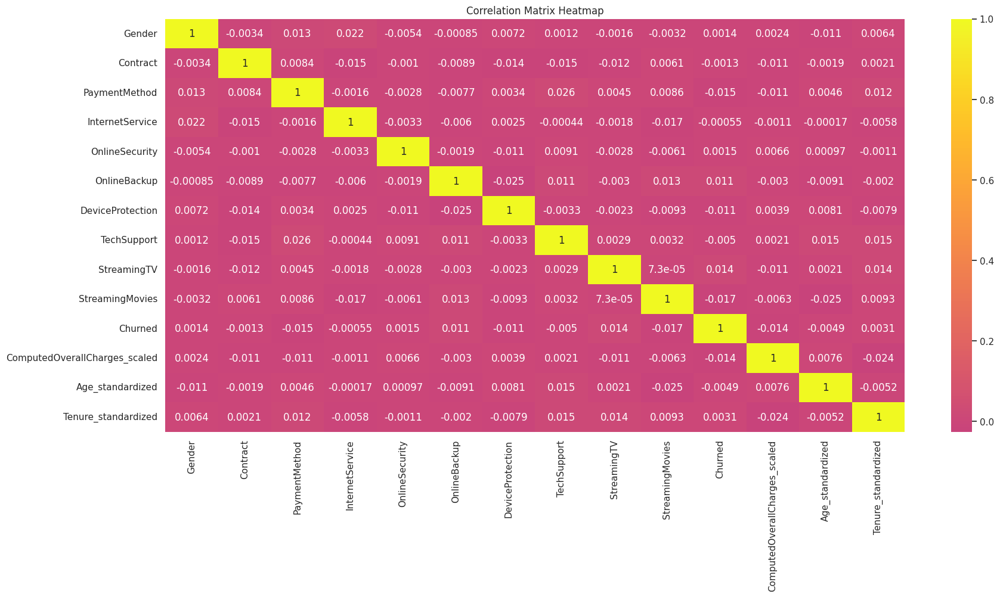

In [ ]:
# Create the heatmap
plt.figure(figsize=(20, 9))
sns.heatmap(df.corr(), annot=True, cmap='plasma', center=0)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [ ]:
# Create the heatmap
# plt.figure(figsize=(20, 9))
# sns.heatmap(df.corr(), annot=True, cmap='PuBu', center=0)
# plt.title('Correlation Matrix Heatmap')
# plt.show()

In [ ]:
# Import required methods from sklearn
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier


In [ ]:
# from sklearn.ensemble import RandomForestClassifier

X = df.drop('Churned', axis=1)
y = df['Churned']

# model = RandomForestClassifier()
# model.fit(X, y)

# feature_importances = model.feature_importances_


In [ ]:
# feature_importances

In [ ]:
# corr_matrix = df.corr()
# corr_with_target = corr_matrix['Churned'].abs().sort_values(ascending=False)


In [ ]:
# corr_with_target

In [ ]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import train_test_split


In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Initialize and Train Random Forest Model

In [ ]:
# # Initialize Random Forest classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

Evaluate the Model

In [ ]:
# # Make predictions
y_pred = rf_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.49


Confusion Matrix and Classification Report

In [ ]:
# # Confusion matrix
# from sklearn.metrics import classification_report

conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(conf_matrix)

# Classification report
class_report = classification_report(y_test, y_pred)
print('Classification Report:')
print(class_report)



Confusion Matrix:
[[525 463]
 [556 456]]
Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.53      0.51       988
           1       0.50      0.45      0.47      1012

    accuracy                           0.49      2000
   macro avg       0.49      0.49      0.49      2000
weighted avg       0.49      0.49      0.49      2000



Cross-Validation Implementation

In [ ]:
# import numpy as np
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Define the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Define the cross-validation strategy
# StratifiedKFold is used for classification tasks to ensure each fold has roughly the same class distribution as the original dataset
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(rf_model, X, y, cv=cv, scoring='accuracy')

# Print cross-validation scores
print("Cross-Validation Scores:")
print(cv_scores)

# Calculate and print mean accuracy across folds
print(f"Mean Accuracy: {np.mean(cv_scores):.2f}")


Cross-Validation Scores:
[0.4965 0.495  0.504  0.497  0.502 ]
Mean Accuracy: 0.50


Initialize and Train Gradient Boosting Model

In [ ]:
# # Initialize Gradient Boosting classifier
# from sklearn.ensemble import GradientBoostingClassifier
# gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

# # Train the model
# gb_model.fit(X_train, y_train)


Predictions and Accuracy

In [ ]:
# # Make predictions
# y_pred = gb_model.predict(X_test)

# # Calculate accuracy
# accuracy = accuracy_score(y_test, y_pred)
# print(f'Accuracy: {accuracy:.2f}')

Confusion Matrix and Classification Report

In [ ]:
# # Confusion matrix
# conf_matrix = confusion_matrix(y_test, y_pred)
# print('Confusion Matrix:')
# print(conf_matrix)

# # Classification report
# class_report = classification_report(y_test, y_pred)
# print('Classification Report:')
# print(class_report)


Feature Importance

In [ ]:
# # Extract feature importances
# feature_importances = gb_model.feature_importances_

# # Create a DataFrame to display feature importances
# feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
# feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# print('Feature Importances:')
# print(feature_importance_df)


In [ ]:
import pickle


In [ ]:
# import pickle

# # Load the model
# model_path = 'trained_model.pkl'
# with open(model_path, 'rb') as f:
#     model = pickle.load(f)

In [ ]:
# Make pickle file of our model
pickle.dump(rf_model, open("churn.pkl", "wb"))

In [ ]:
df.columns

Index(['Gender', 'Contract', 'PaymentMethod', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Churned',
       'ComputedOverallCharges_scaled', 'Age_standardized',
       'Tenure_standardized'],
      dtype='object')